In [14]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata as ad
import omnipath as op


In [3]:
sc.set_figure_params(dpi=100, color_map='viridis_r')
sc.settings.verbosity = 1
sc.logging.print_header()

scanpy==1.9.3 anndata==0.9.1 numpy==1.23.5 scipy==1.10.1 pandas==1.5.2 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.9


### read in metadata and train_cite_inputs.h5

In [4]:
metadata = pd.read_csv('../../metadata.csv')
metadata[metadata['cell_id'].isin(['45006fe3e4c8','d02759a80ba2','c016c6b0efa5','ba7f733a4f75','fbcf2443ffb2'])]

,cell_id,day,donor,cell_type,technology
28043,45006fe3e4c8,2,32606,HSC,citeseq
28044,d02759a80ba2,2,32606,HSC,citeseq
28045,c016c6b0efa5,2,32606,EryP,citeseq
28046,ba7f733a4f75,2,32606,NeuP,citeseq
28047,fbcf2443ffb2,2,32606,EryP,citeseq


In [5]:
# %pip install tables   
# necessary for pd.read_hdf()
df = pd.read_hdf('../../train_cite_inputs.h5')
df

gene_id,ENSG00000121410_A1BG,ENSG00000268895_A1BG-AS1,ENSG00000175899_A2M,ENSG00000245105_A2M-AS1,ENSG00000166535_A2ML1,ENSG00000128274_A4GALT,ENSG00000094914_AAAS,ENSG00000081760_AACS,ENSG00000109576_AADAT,ENSG00000103591_AAGAB,...,ENSG00000153975_ZUP1,ENSG00000086827_ZW10,ENSG00000174442_ZWILCH,ENSG00000122952_ZWINT,ENSG00000198205_ZXDA,ENSG00000198455_ZXDB,ENSG00000070476_ZXDC,ENSG00000162378_ZYG11B,ENSG00000159840_ZYX,ENSG00000074755_ZZEF1
cell_id,,,,,,,,,,,,,,,,,,,,,
45006fe3e4c8,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,4.090185,0.000000
d02759a80ba2,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,4.039545,0.0,0.0,0.000000,0.000000,0.000000,0.000000
c016c6b0efa5,0.0,0.0,0.0,0.0,0.0,3.847321,0.000000,3.847321,3.847321,0.000000,...,0.000000,0.000000,3.847321,4.529743,0.0,0.0,0.000000,3.847321,3.847321,0.000000
ba7f733a4f75,0.0,0.0,0.0,0.0,0.0,0.000000,3.436846,3.436846,0.000000,0.000000,...,3.436846,0.000000,4.113780,5.020215,0.0,0.0,0.000000,3.436846,4.113780,0.000000
fbcf2443ffb2,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,4.196826,0.000000,0.000000,...,0.000000,4.196826,4.196826,4.196826,0.0,0.0,3.518610,4.196826,3.518610,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650ee456f0f3,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,4.397535,4.397535,5.084510,0.0,0.0,0.000000,0.000000,4.397535,4.397535
cc506e7707f5,0.0,0.0,0.0,0.0,0.0,0.000000,3.981467,4.665241,0.000000,0.000000,...,3.981467,0.000000,4.665241,3.981467,0.0,0.0,0.000000,0.000000,3.981467,0.000000
a91f1b55a520,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,4.497696,0.000000,4.497696,...,0.000000,0.000000,0.000000,4.497696,0.0,0.0,3.815622,4.497696,0.000000,0.000000


In [6]:
# filter dataset by IDs in list
metadata_filtered = metadata[metadata['cell_id'].isin(df.index.values)].set_index('cell_id')
metadata_filtered.head(3)

,day,donor,cell_type,technology
cell_id,,,,
45006fe3e4c8,2,32606,HSC,citeseq
d02759a80ba2,2,32606,HSC,citeseq
c016c6b0efa5,2,32606,EryP,citeseq


In [7]:
train_cite_inputs = ad.AnnData(df, obs=metadata_filtered)
train_cite_inputs

AnnData object with n_obs × n_vars = 70988 × 22050
    obs: 'day', 'donor', 'cell_type', 'technology'

In [8]:
import h5py
with h5py.File(r'../../train_cite_inputs.h5', 'r') as f:
    keys = []
    f.visit(keys.append)
    print(keys)      # keys to use for reading in datasets... still not working

['train_cite_inputs', 'train_cite_inputs/axis0', 'train_cite_inputs/axis1', 'train_cite_inputs/block0_items', 'train_cite_inputs/block0_values']


### omnipath

In [13]:
interactions = op.interactions.AllInteractions.get(organism='human')
interactions  # source and target are genes -> check again

,source,target,is_directed,is_stimulation,is_inhibition,consensus_direction,consensus_stimulation,consensus_inhibition,curation_effort,references,sources,type,references_stripped,n_references,n_sources,n_primary_sources
0,P0DP25,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
1,P0DP24,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
2,P0DP23,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
3,Q03135,P48995,True,True,False,True,True,False,13,DIP:19897728;HPRD:12732636;IntAct:19897728;Lit...,DIP;HPRD;IntAct;Lit-BM-17;TRIP,post_translational,10980191;12732636;14551243;16822931;18430726;1...,8,5,5
4,P14416,P48995,True,True,False,True,True,False,1,TRIP:18261457,TRIP,post_translational,18261457,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226401,92135,Q8TDS4,True,False,False,False,False,False,1,Cellinker:15929991,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,15929991,1,2,1
226402,5311358,O94759,True,False,False,False,False,False,1,Cellinker:22847436,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,22847436,1,2,1
226403,5280360,Q9Y5Y4,True,False,False,False,False,False,1,Cellinker:12466225,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,12466225,1,2,1
226404,5311358,P48544,True,False,False,False,False,False,2,Cellinker:8688080;Cellinker:9804555,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,8688080;9804555,2,2,1


In [15]:
op.requests.Annotations.resources()
# CellPhoneDB, ComPPI, ...

# transcriptional
# HPA_small = op.requests.Annotations.get(
# proteins = gene_ids[:10],  #[:3],  #['A1BG'],            # ['TP53', 'LMNA'],
# resources = 'ComPPI'
# )

('Adhesome',
 'Almen2009',
 'Baccin2019',
 'CORUM_Funcat',
 'CORUM_GO',
 'CSPA',
 'CSPA_celltype',
 'CancerDrugsDB',
 'CancerGeneCensus',
 'CancerSEA',
 'CellCall',
 'CellCellInteractions',
 'CellChatDB',
 'CellChatDB_complex',
 'CellPhoneDB',
 'CellPhoneDB_complex',
 'CellTalkDB',
 'CellTypist',
 'Cellinker',
 'Cellinker_complex',
 'ComPPI',
 'CytoSig',
 'DGIdb',
 'DisGeNet',
 'EMBRACE',
 'Exocarta',
 'GO_Intercell',
 'GPCRdb',
 'Guide2Pharma',
 'HGNC',
 'HPA_secretome',
 'HPA_subcellular',
 'HPA_tissue',
 'HPMR',
 'HumanCellMap',
 'ICELLNET',
 'ICELLNET_complex',
 'IntOGen',
 'Integrins',
 'InterPro',
 'KEGG-PC',
 'Kirouac2010',
 'LOCATE',
 'LRdb',
 'Lambert2018',
 'MCAM',
 'MSigDB',
 'Matrisome',
 'MatrixDB',
 'Membranome',
 'NetPath',
 'OPM',
 'PROGENy',
 'PanglaoDB',
 'Phobius',
 'Phosphatome',
 'Ramilowski2015',
 'Ramilowski_location',
 'SIGNOR',
 'SignaLink_function',
 'SignaLink_pathway',
 'Surfaceome',
 'TCDB',
 'TFcensus',
 'TopDB',
 'UniProt_family',
 'UniProt_keyword',
 'Un

In [ ]:
HPA_small = op.requests.Annotations.get(
proteins = gene_ids[:10],  #[:3],  #['A1BG'],            # ['TP53', 'LMNA'],
resources = 'ComPPI'
)
HPA_small

In [30]:
gene_ids = train_cite_inputs.var.index.tolist()
cell_ids = train_cite_inputs.obs.index.tolist()
gene_ids

['A1BG',
 'A1BG-AS1',
 'A2M',
 'A2M-AS1',
 'A2ML1',
 'A4GALT',
 'AAAS',
 'AACS',
 'AADAT',
 'AAGAB',
 'AAK1',
 'AAMDC',
 'AAMP',
 'AANAT',
 'AAR2',
 'AARD',
 'AARS',
 'AARS2',
 'AARSD1',
 'AASDH',
 'AASDHPPT',
 'AASS',
 'AATBC',
 'AATF',
 'AATK',
 'ABALON',
 'ABAT',
 'ABCA1',
 'ABCA10',
 'ABCA11P',
 'ABCA13',
 'ABCA17P',
 'ABCA2',
 'ABCA3',
 'ABCA5',
 'ABCA6',
 'ABCA7',
 'ABCB1',
 'ABCB10',
 'ABCB11',
 'ABCB4',
 'ABCB6',
 'ABCB7',
 'ABCB8',
 'ABCB9',
 'ABCC1',
 'ABCC10',
 'ABCC13',
 'ABCC2',
 'ABCC3',
 'ABCC4',
 'ABCC5',
 'ABCC6',
 'ABCD1',
 'ABCD3',
 'ABCD4',
 'ABCE1',
 'ABCF1',
 'ABCF2',
 'ABCF3',
 'ABCG1',
 'ABCG2',
 'ABCG8',
 'ABHD1',
 'ABHD10',
 'ABHD11',
 'ABHD11-AS1',
 'ABHD12',
 'ABHD12B',
 'ABHD13',
 'ABHD14A',
 'ABHD14A-ACY1',
 'ABHD14B',
 'ABHD15',
 'ABHD15-AS1',
 'ABHD16A',
 'ABHD17A',
 'ABHD17AP3',
 'ABHD17B',
 'ABHD17C',
 'ABHD18',
 'ABHD2',
 'ABHD3',
 'ABHD4',
 'ABHD5',
 'ABHD6',
 'ABHD8',
 'ABI1',
 'ABI2',
 'ABI3',
 'ABI3BP',
 'ABL1',
 'ABL2',
 'ABLIM1',
 'ABLIM3',
 'AB

### preprocess

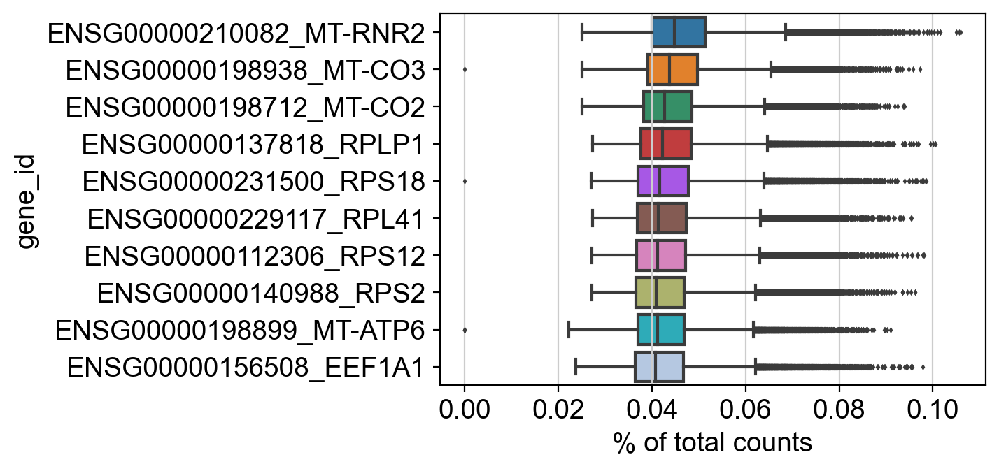

In [9]:
sc.pl.highest_expr_genes(train_cite_inputs, n_top=10)

In [10]:
sc.pp.filter_cells(train_cite_inputs, min_genes=200)
sc.pp.filter_genes(train_cite_inputs, min_cells=10)  # 3

In [11]:
train_cite_inputs

AnnData object with n_obs × n_vars = 70988 × 21601
    obs: 'day', 'donor', 'cell_type', 'technology', 'n_genes'
    var: 'n_cells'

In [19]:
split_var_names = [n.split('_')[1] for n in train_cite_inputs.var_names]
train_cite_inputs.var_names = split_var_names

In [13]:
train_cite_inputs.var_names_make_unique()  

In [14]:
# information about mitochondrial genes (-> quality control)
train_cite_inputs.var['mt'] = train_cite_inputs.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(train_cite_inputs, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

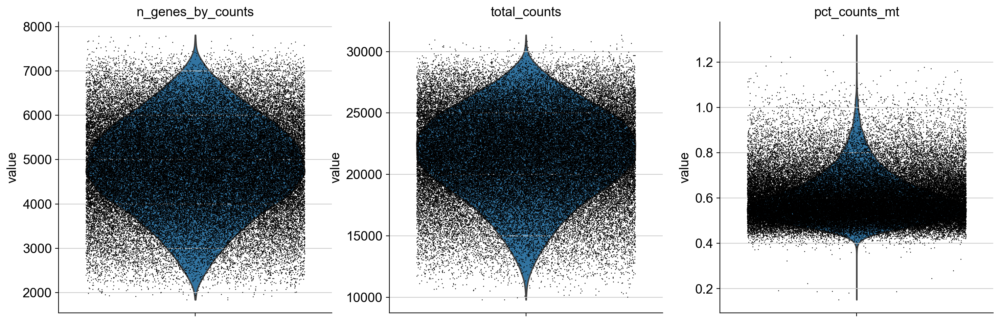

In [15]:
sc.pl.violin(train_cite_inputs, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

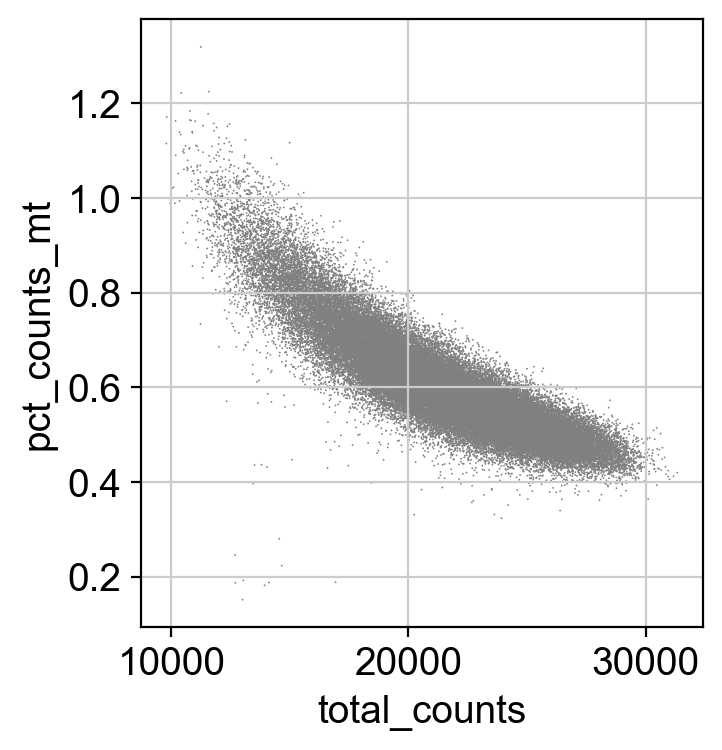

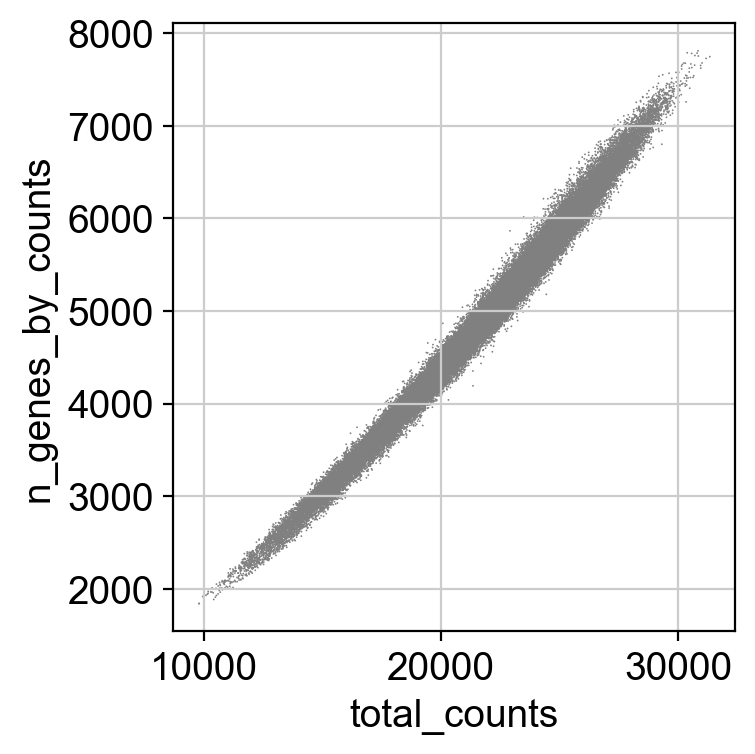

In [16]:
sc.pl.scatter(train_cite_inputs, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(train_cite_inputs, x='total_counts', y='n_genes_by_counts')

In [17]:
# filter cells that have too many mitochondrial genes expressed or too many total counts
train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.n_genes_by_counts < 7500, :]
train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.n_genes_by_counts > 2500, :]
train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.pct_counts_mt < 0.9, :]
train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.pct_counts_mt > 0.42, :]

In [18]:
# total-count normalize -> 10000 reads per cell
sc.pp.normalize_total(train_cite_inputs, target_sum=1e4)

c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [19]:
# logarithmize data
sc.pp.log1p(train_cite_inputs)

In [23]:
# identify highly variable genes
sc.pp.highly_variable_genes(train_cite_inputs, min_mean=0.0125, max_mean=3, min_disp=0.5)


MemoryError: Unable to allocate 5.58 GiB for an array with shape (69351, 21601) and data type float32

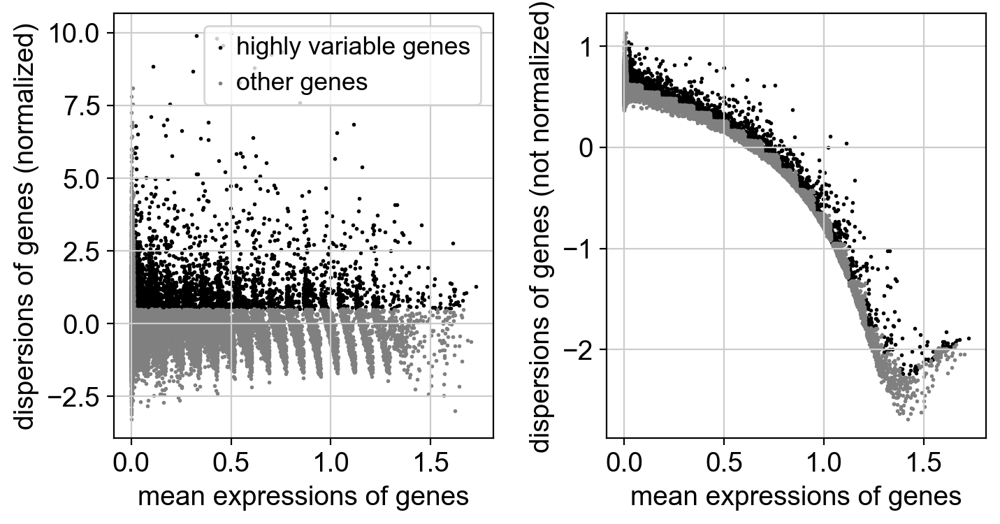

In [ ]:
sc.pl.highly_variable_genes(train_cite_inputs)

In [ ]:
# set .raw attribute -> normalized and logarithmized raw gene expression
train_cite_inputs.raw = train_cite_inputs


In [ ]:
# filtering
train_cite_inputs = train_cite_inputs[:, train_cite_inputs.var.highly_variable]
# regress out effects of total counts per cell, scale gene to unit variance
sc.pp.regress_out(train_cite_inputs, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(train_cite_inputs, max_value=10)


### PCA
-> reduce dimensionality

In [ ]:
sc.tl.pca(train_cite_inputs, svd_solver='arpack')

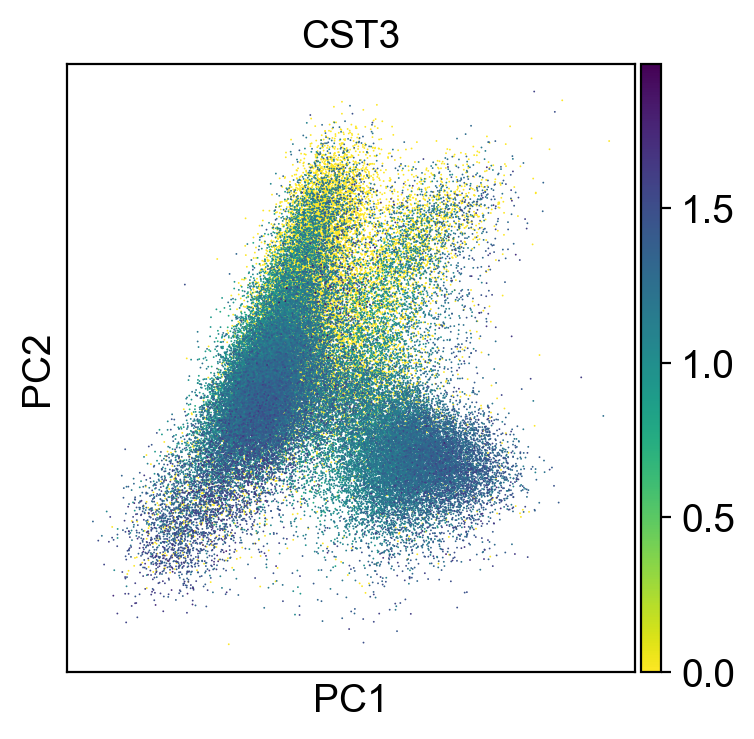

In [ ]:
sc.pl.pca(train_cite_inputs, color='CST3')

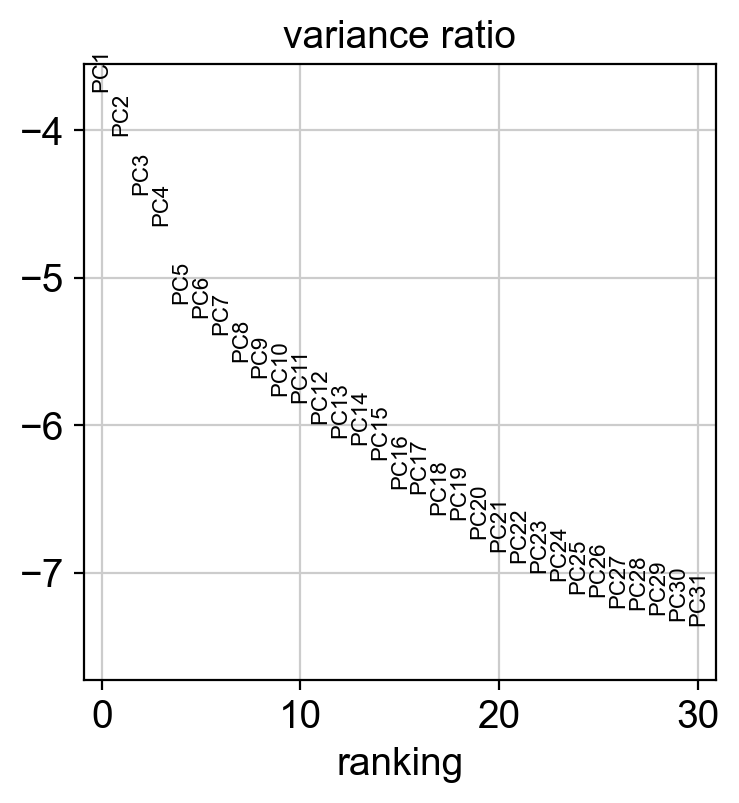

In [ ]:
sc.pl.pca_variance_ratio(train_cite_inputs, log=True)

In [ ]:
train_cite_inputs.write('../../train_cite_inputs_preprocessed.h5')


In [ ]:
train_cite_inputs

AnnData object with n_obs × n_vars = 69351 × 3459
    obs: 'day', 'donor', 'cell_type', 'technology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [ ]:
# neighbourhood graph of cells:
sc.pp.neighbors(train_cite_inputs, n_neighbors=10, n_pcs=40)

In [ ]:
sc.tl.umap(train_cite_inputs)

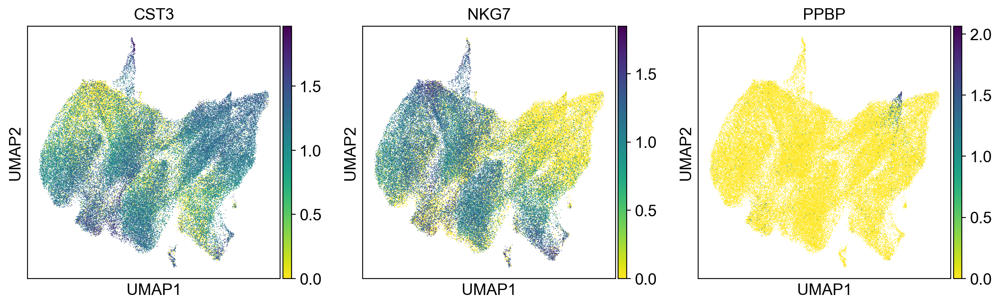

In [ ]:
sc.pl.umap(train_cite_inputs, color=['CST3', 'NKG7', 'PPBP'])  # show raw gene expression

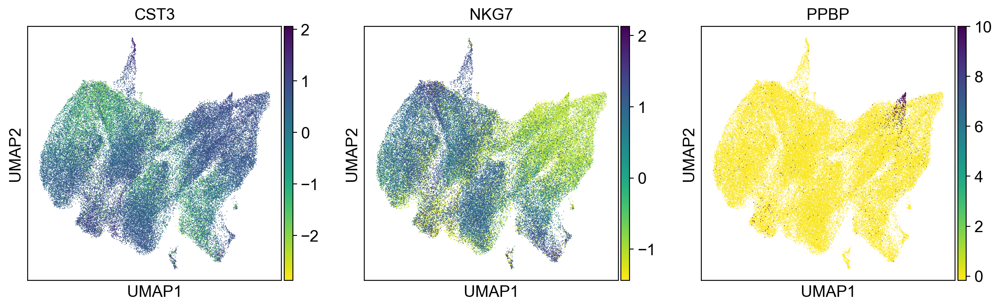

In [ ]:
sc.pl.umap(train_cite_inputs, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)  # plot scaled and corrected gene expression

c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


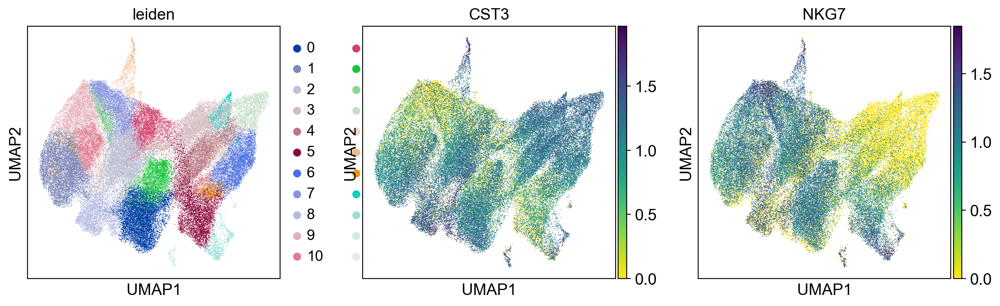

In [ ]:
sc.tl.leiden(train_cite_inputs)
sc.pl.umap(train_cite_inputs, color=['leiden', 'CST3', 'NKG7'])

### finding marker genes

c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\tools\_rank_g

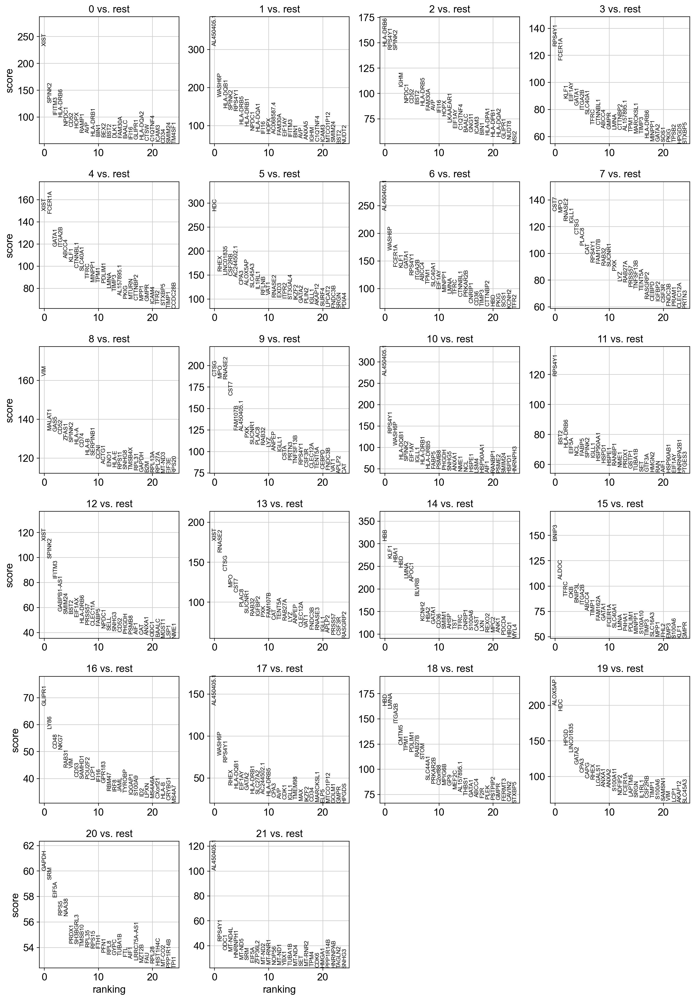

In [ ]:
# 35 minutes
sc.tl.rank_genes_groups(train_cite_inputs, 'leiden', method='t-test')
sc.pl.rank_genes_groups(train_cite_inputs, n_genes=25, sharey=False)

In [ ]:
train_cite_inputs.write('../../rank_genes_groups')

In [ ]:
pd.DataFrame(train_cite_inputs.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,XIST,AL450405.1,HLA-DRB6,RPS4Y1,XIST,HDC,AL450405.1,CST7,VIM,CTSG,...,XIST,XIST,HBB,BNIP3,GLIPR1,AL450405.1,HBD,ALOX5AP,GAPDH,AL450405.1
1,SPINK2,WASH6P,RPS4Y1,FCER1A,FCER1A,RHEX,WASH6P,MPO,MALAT1,MPO,...,SPINK2,RNASE2,KLF1,ALDOC,LY86,WASH6P,LMNA,HDC,SRM,RPS4Y1
2,IFITM3,HLA-DQB1,SPINK2,KLF1,GATA1,LINC01835,FCER1A,RNASE2,GAS5,RNASE2,...,IFITM3,CTSG,HBA1,TFRC,CD48,RPS4Y1,ITGA2B,HPGD,EIF5A,ODC1
3,HLA-DRB6,SPINK2,IGHM,EIF1AY,ITGA2B,CSF2RB,KLF1,IGLL1,CD52,CST7,...,GABPB1-AS1,MPO,HBD,CKB,NKG7,RHEX,CMTM5,LINC01835,RPS5,MT-ND4L
4,NPDC1,RPS4Y1,NPDC1,GATA1,ABCC4,AC244502.1,GATA1,CTSG,ZFAS1,FAM107B,...,SMIM24,CST7,LMNA,BNIP3L,RAB31,HLA-DQB1,TPM1,GATA2,NAA38,HNRNPH1


In [ ]:
result = train_cite_inputs.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,17_n,17_p,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p
0,XIST,0.0,AL450405.1,0.0,HLA-DRB6,0.0,RPS4Y1,0.0,XIST,0.0,...,AL450405.1,0.000000e+00,HBD,0.0,ALOX5AP,0.0,GAPDH,8.311952e-138,AL450405.1,6.737648e-76
1,SPINK2,0.0,WASH6P,0.0,RPS4Y1,0.0,FCER1A,0.0,FCER1A,0.0,...,WASH6P,0.000000e+00,LMNA,0.0,HDC,0.0,SRM,1.245661e-140,RPS4Y1,1.576154e-50
2,IFITM3,0.0,HLA-DQB1,0.0,SPINK2,0.0,KLF1,0.0,GATA1,0.0,...,RPS4Y1,0.000000e+00,ITGA2B,0.0,HPGD,0.0,EIF5A,3.118824e-136,ODC1,2.288216e-44
3,HLA-DRB6,0.0,SPINK2,0.0,IGHM,0.0,EIF1AY,0.0,ITGA2B,0.0,...,RHEX,3.781776e-221,CMTM5,0.0,LINC01835,0.0,RPS5,2.422068e-132,MT-ND4L,3.746196e-43
4,NPDC1,0.0,RPS4Y1,0.0,NPDC1,0.0,GATA1,0.0,ABCC4,0.0,...,HLA-DQB1,2.168295e-197,TPM1,0.0,GATA2,0.0,NAA38,6.714516e-133,HNRNPH1,3.451892e-39


In [ ]:
result = train_cite_inputs.uns['rank_genes_groups']
for group in result['names'].dtype.names:
    print(group)
    print(result['names'][group][:10])

0
['XIST' 'SPINK2' 'IFITM3' 'HLA-DRB6' 'NPDC1' 'CD52' 'HOPX' 'RAMP1' 'AVP'
 'HLA-DRB1']
1
['AL450405.1' 'WASH6P' 'HLA-DQB1' 'SPINK2' 'RPS4Y1' 'HLA-DRB5' 'HLA-DRB1'
 'NPDC1' 'HLA-DQA1' 'IFI16']
2
['HLA-DRB6' 'RPS4Y1' 'SPINK2' 'IGHM' 'NPDC1' 'CD52' 'BST2' 'HLA-DRB5'
 'FAM30A' 'AVP']
3
['RPS4Y1' 'FCER1A' 'KLF1' 'EIF1AY' 'GATA1' 'ITGA2B' 'SLC40A1' 'TFRC'
 'CTNNBL1' 'ABCC4']
4
['XIST' 'FCER1A' 'GATA1' 'ITGA2B' 'ABCC4' 'KLF1' 'CTNNBL1' 'SLC40A1'
 'TFRC' 'MINPP1']
5
['HDC' 'RHEX' 'LINC01835' 'CSF2RB' 'AC244502.1' 'CPA3' 'ALOX5AP' 'SLC45A3'
 'IL1RL1' 'RFLNB']
6
['AL450405.1' 'WASH6P' 'FCER1A' 'KLF1' 'GATA1' 'RPS4Y1' 'ITGA2B' 'ABCC4'
 'TPM1' 'SLC40A1']
7
['CST7' 'MPO' 'RNASE2' 'IGLL1' 'CTSG' 'PLAC8' 'CAT' 'RPS4Y1' 'FAM107B'
 'RAB32']
8
['VIM' 'MALAT1' 'GAS5' 'CD52' 'ZFAS1' 'SPINK2' 'HLA-A' 'CD74' 'HLA-B'
 'SERPINB1']
9
['CTSG' 'MPO' 'RNASE2' 'CST7' 'FAM107B' 'AL450405.1' 'PXK' 'SUCNR1'
 'PLAC8' 'RAB32']
10
['AL450405.1' 'RPS4Y1' 'WASH6P' 'HLA-DQB1' 'SPINK2' 'EIF1AY' 'IGLL1'
 'HLA-DRB1' 'HLA-DRB

### visualize according to Scanpy tutorial

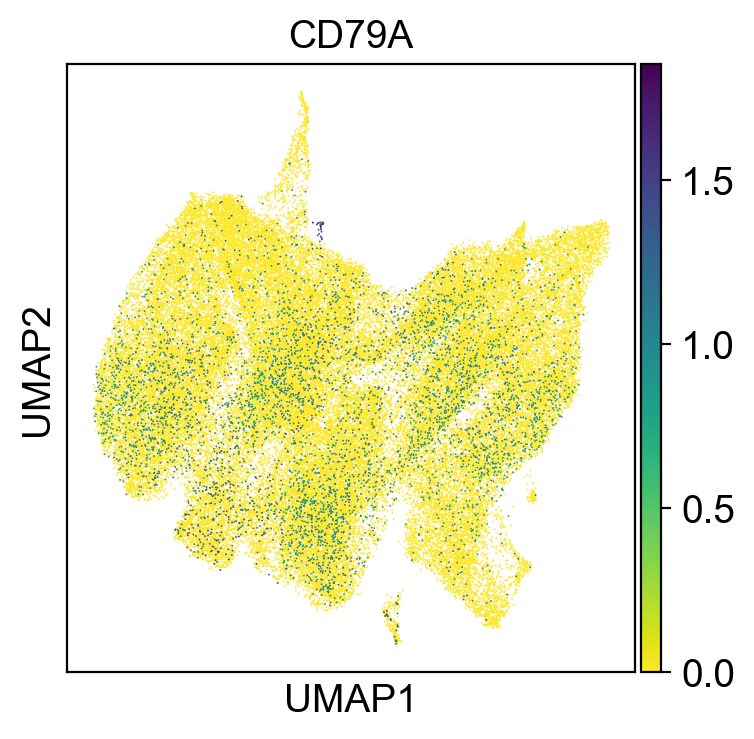

In [ ]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(train_cite_inputs, color='CD79A')

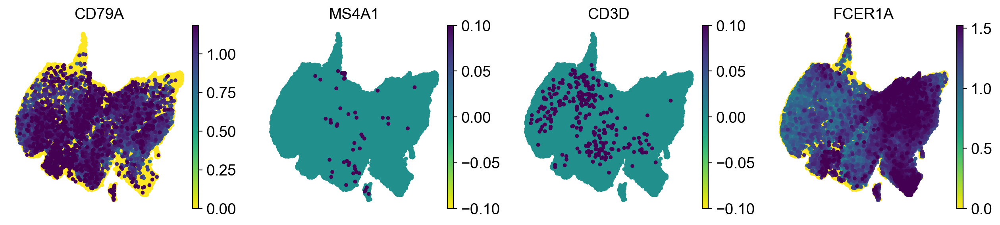

In [ ]:
with rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(train_cite_inputs, color=['CD79A', 'MS4A1', 'CD3D', 'FCER1A'], s=50, frameon=False, ncols=4, vmax='p99')

In [ ]:
sc.tl.leiden(train_cite_inputs, key_added='clusters', resolution=0.5)

c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\e4ehry8\AppData\Local\miniconda3\envs\val_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


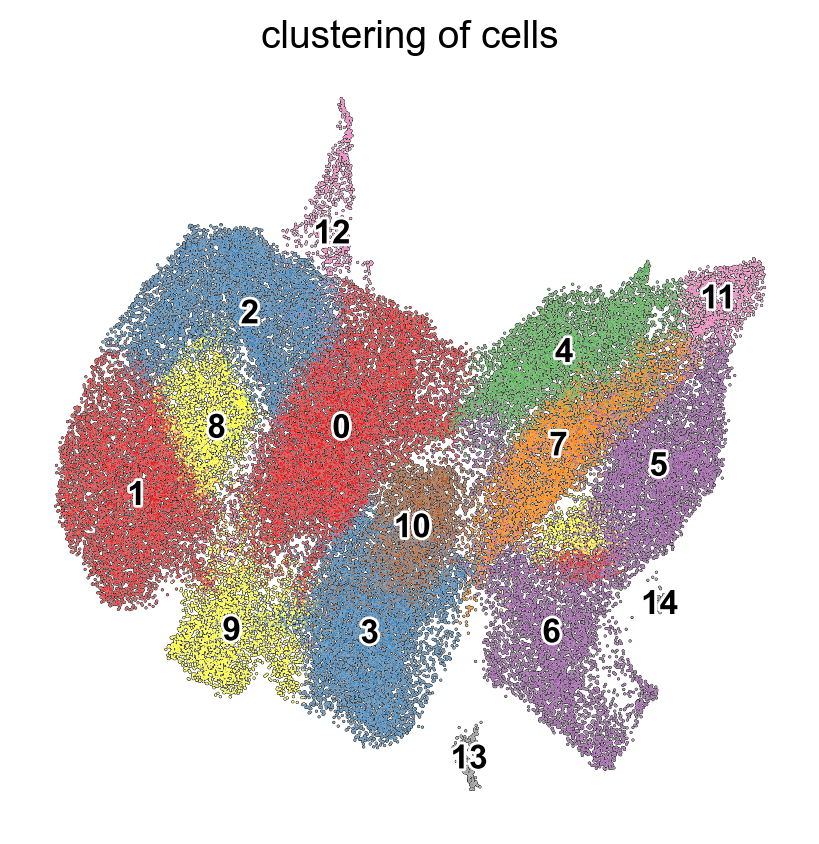

In [ ]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(train_cite_inputs, color='clusters', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

In [ ]:
# identification of clusters based on known marker genes
# TODO -> are marker genes known? Do we have a marker_genes_dict?